# Présentation d'article : "Image Style Transfer Using Convolutional Neural Networks"
# Article Presentation: "Image Style Transfer Using Convolutional Neural Networks"

In [1]:
# Importation des bibliothèques nécessaires pour le projet
# Importing the necessary libraries for the project
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19
from tensorflow.keras.models import Model


# Constantes / Constants

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1' # Désactive les warnings de TensorFlow / Disable TensorFlow warnings

# Limiter l'allocation de mémoire GPU de TensorFlow / Limit TensorFlow GPU memory allocation
tf.keras.backend.clear_session()

# Hauteur cible des images / Target image height
RESIZE_HEIGHT = 300 

# The layer to use for the content loss. / La couche à utiliser pour la perte de contenu
CONTENT_LAYER_NAME = "block5_conv2" # "block2_conv2"

# List of layers to use for the style loss. / Liste des couches à utiliser pour la perte de style
STYLE_LAYER_NAMES = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]

# Fonctions / Functions
def fetch_img(img_path):
    """
    Cette fonction retourne l'image dans un format PIL.
    --------------------------------------------------
    This function returns the image in a PIL format.
    """
    return keras.preprocessing.image.load_img(img_path)

def compute_target_size(img, target_h):
    """
    Calcule la largeur cible d'une image tout en maintenant le rapport d'aspect.
    ------------------------------------------------
    Calculates the new target width for an image while maintaining the aspect ratio.
    """
    img_w, img_h = img.size    
    target_w = img_w * target_h // img_h
    return (target_w,target_h)

# Gram matrix
def gram_matrix(x):
   """
    Calcul de la matrice de Gram pour un tenseur donné
    --------------------------------------------------
    Calculation of the Gram matrix for a given tensor
    Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
   x = tf.transpose(x, (2, 0, 1))
   features = tf.reshape(x, (tf.shape(x)[0], -1))
   gram = tf.matmul(features, tf.transpose(features))
   return gram



# Chargement respectif des chemins pour l'image de contenu et l'image de style.
# Loading the respective paths for the content image and the style image.

(400, 300)


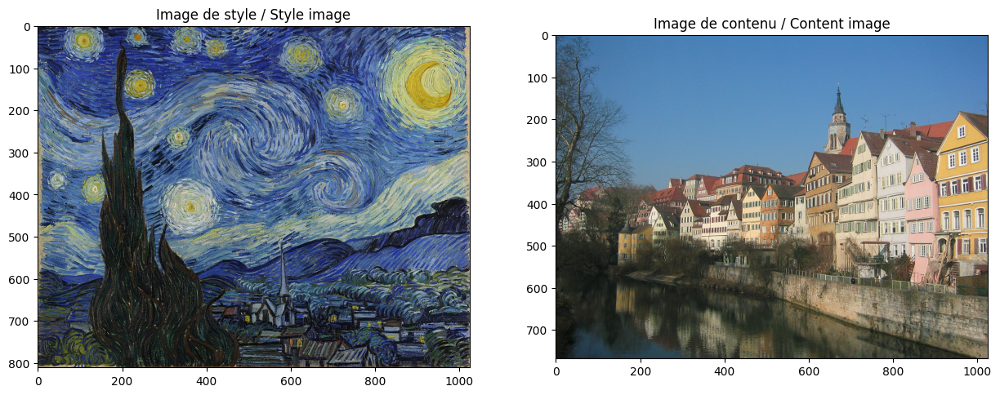

In [2]:
# Chargement des images / Loading images
path = os.path.abspath(os.getcwd())
tuebingen_path = keras.utils.get_file(path + '\dataset\content\Tuebingen_Neckarfront.jpg', 'https://drive.google.com/file/d/1TvLC-g2KFzMK98b-Paca1Ho_AjIMdOCO/view?usp=drive_link')
turtle_path = keras.utils.get_file(path + '\dataset\content\Green_Sea_Turtle.jpg', 'https://drive.google.com/file/d/1Vqd-0vRxXyq1EOzpsiYwtiPNEoVE4OTm/view?usp=drive_link')
leoBackert_path = keras.utils.get_file(path + '\dataset\content\Leo_Backert.jpg', 'https://drive.google.com/file/d/1vViLkaNuLDm_vKHWyYiXOSPIzsKj4x7m/view?usp=drive_link')
vanGogh_path = keras.utils.get_file(path + '\dataset\style\Van_Gogh.jpg', 'https://drive.google.com/file/d/18TxMxMugbKpRXrLLD304VgvWKn9BboBx/view?usp=drive_link')
greatWave_path = keras.utils.get_file(path + '\dataset\style\The_Great_Wave_off_Kanagawa.jpg', 'https://drive.google.com/file/d/12UBwqrp58rG6ywja0hlD2Kr6hhJX-DO-/view?usp=drive_link')
kandinsky_path = keras.utils.get_file(path + '\dataset\style\Kandinsky.jpg', 'https://drive.google.com/file/d/1SP3sHSM7kW1Tdv1X6zqc_KusUS5Njyku/view?usp=drive_link')

images_dict = {
    'Tuebingen_VanGogh' : {
        "content_path" : tuebingen_path,
        "style_path"   : vanGogh_path,
        "content"      : fetch_img(tuebingen_path),
        "style"        : fetch_img(vanGogh_path)
    },
    'Turtle_GreatWave' : {
        "content_path" : turtle_path,
        "style_path"   : greatWave_path,
        "content"      : fetch_img(turtle_path),
        "style"        : fetch_img(greatWave_path)
    },
    'Leo_Kandinsky' : {
        "content_path" : leoBackert_path,
        "style_path"   : kandinsky_path,
        "content"      : fetch_img(leoBackert_path),
        "style"        : fetch_img(kandinsky_path)
    }
}

# Choix de l'ensemble d'images (contenu et style) à utiliser / Choosing the image pair (content and style) to use
pair_key = "Tuebingen_VanGogh"

content_img = images_dict[pair_key]["content"]
style_img = images_dict[pair_key]["style"]



# Affichage / Display
plt.figure(figsize=(15,15))
# Affichage de style_image / Displaying style_image
plt.subplot(1, 2, 1)
plt.title("Image de style / Style image")
plt.imshow(style_img)

# Affichage du content_image / Displaying content_image
plt.subplot(1, 2, 2)
plt.title("Image de contenu / Content image")
plt.imshow(content_img)

# Calcul de la taille cible / Compute the target size
(target_w, target_h) = compute_target_size(content_img, RESIZE_HEIGHT)
print((target_w, target_h))

# Prétraitement

Le prétraitement des images est nécessaire pour s'assurer que celles-ci aient les mêmes caractéristiques (taille, intensité moyenne, etc.) que celles des images utilisées pour l'entraînement. Il est également utilisé pour faire de l'augmentation de jeu de données, en ajoutant de la diversité dans le jeu d'entraînement pour augmenter le nombre d'images disponibles. Dans le cas du transfert de style, on l'utilise pour que les images respectent la même distribution que pour l'entraînement du réseau VGG19 utilisé.

Puisqu'un réseau préentraîné est utilisé pour le transfert de style, il est important d'appliquer les mêmes paramètres de normalisation que ceux utilisés pour l'entraînement. Le CNN ayant été entraîné sur ImageNet, on applique les mêmes paramètres que dans la documentation. Il est à noter que ces paramètres représentent la moyenne et la déviation standard pour chaque canal de l'image. Une image standard de type RGB dispose de 3 canaux (Red, Green, Blue).



*   ImageNet_mean = [0.485, 0.456, 0.406]
*   ImageNet_std = [0.229, 0.224, 0.225]


# Preprocessing

Image preprocessing is necessary to ensure that the images have the same characteristics (size, average intensity, etc.) as those used for training. It is also used for data augmentation, adding diversity to the training set to increase the number of available images. In the case of style transfer, it ensures that the images follow the same distribution as the one used for training the VGG19 network.

Since a pre-trained network is used for style transfer, it is important to apply the same normalization parameters as those used during training. The CNN was trained on ImageNet, so we apply the same parameters as stated in the documentation. It is worth noting that these parameters represent the mean and standard deviation for each image channel. A standard RGB image has 3 channels (Red, Green, Blue).

    ImageNet_mean = [0.485, 0.456, 0.406]
    ImageNet_std = [0.229, 0.224, 0.225]



In [3]:
# Étapes de prétraitement
    # 1. Redimensionner l'image à la taille cible (target_height, target_width) -> (H, W)
    # 2. Transformer l'image PIL en tableau numpy -> (H, W, C)
    # 3. Ajouter une dimension supplémentaire pour correspondre au format d'entrée du modèle -> (B, H, W, C)
    #    où B est la taille de batch (lot) = 1.
    # 4. Appliquer la normalisation ImageNet requise par le réseau VGG19.
#
# Preprocessing steps
    # 1. Resize the image to the target size (target_height, target_width) -> (H, W)
    # 2. Convert the PIL image to a numpy array -> (H, W, C)
    # 3. Add an extra dimension to match the input format of the model -> (B, H, W, C)
    #    where B is the batch size (1 in this case).
    # 4. Apply ImageNet normalization required by the VGG19 network.

def preprocess_image(image_path, target_height, target_width):
    img = keras.preprocessing.image.load_img(image_path, target_size = (target_height, target_width))
    arr = keras.preprocessing.image.img_to_array(img)
    arr = np.expand_dims(arr, axis = 0)
    arr = vgg19.preprocess_input(arr)
    return tf.convert_to_tensor(arr)

# Post-traitement

Le post-traitement est nécessaire pour s'assurer que les images qui sont générées par le réseau de neurones respectent les propriétés naturelles d'une image réelle pour pouvoir être affichées avec Matplotlib. Une image standard de type RGB contient trois canaux de couleurs qui sont composés de pixels. L'intensité de la couleur de chacun des pixels se trouve dans une plage [0,1]. Toutefois, rien ne garantit que les pixels inférés par le réseau de neurones respecteront cette plage. En effet, comme le réseau VGG19 fait usage de la fonction d'activation sigmoïde, les pixels en sortie sont contenus entre [-1,1] et doivent donc être ramenés entre [0,1]. Il va de même pour la normalisation. Comme le réseau VGG19 a été préentraîné sur ImageNet avec des paramètres de normalisation spécifique à ce jeu de données, on normalise les images de style et de contenu de la même manière en prétraitement. Toutefois, afin d'afficher l'image hybride, il est important de renverser la normalisation pour obtenir un résultat visuellement intéressant.

# Post-processing

Post-processing is necessary to ensure that the images generated by the neural network respect the natural properties of a real image in order to be displayed with Matplotlib. A standard RGB image contains three color channels composed of pixels. The intensity of each pixel's color lies within a range of [0,1]. However, there's no guarantee that the pixels inferred by the neural network will respect this range. Indeed, since the VGG19 network uses a sigmoid activation function, the output pixels are between [-1,1] and need to be scaled back to [0,1]. The same applies to normalization. Since the VGG19 network was pre-trained on ImageNet with specific normalization parameters for that dataset, we normalize the style and content images in the same way during preprocessing. However, to display the hybrid image, it is important to reverse the normalization to obtain a visually appealing result.

In [4]:
# Étapes de post-traitement
    # 1. Convertir le tenseur en tableau numpy / Convert the tensor into a numpy array
    # 2. Redimensionner le tableau pour la forme (H, W, C) / Reshape the array to (H, W, C)
    # 3. Annuler la normalisation ImageNet en réajustant les valeurs des pixels / Undo ImageNet normalization by adjusting pixel values
    # 4. Convertir l'image de BGR en RGB / Convert the image from BGR to RGB
    # 5. Limiter les valeurs des pixels entre 0 et 255 / Clip pixel values between 0 and 255
#
# Post-processing steps
    # 1. Convert the tensor into a numpy array
    # 2. Reshape the array to (H, W, C)
    # 3. Undo ImageNet normalization by adjusting pixel values
    # 4. Convert the image from BGR to RGB
    # 5. Clip pixel values between 0 and 255
def deprocess_image(tensor, result_height, result_width):
    tensor = tensor.numpy()
    tensor = tensor.reshape((result_height, result_width, 3))

    # Remove zero-center by mean pixel
    tensor[:, :, 0] += 103.939
    tensor[:, :, 1] += 116.779
    tensor[:, :, 2] += 123.680

    # 'BGR'->'RGB'
    tensor = tensor[:, :, ::-1]
    return np.clip(tensor, 0, 255).astype("uint8")

content_tensor = preprocess_image(images_dict[pair_key]["content_path"], target_h, target_w)
style_tensor = preprocess_image(images_dict[pair_key]["style_path"], target_h, target_w)

# Chargement VGG19 / Load VGG19

Téléchargement la portion "features" du VGG19. Nous n'avons pas besoin des couches de classification.
Downloading the features portion of the VGG19. We don't need the classification layers.

In [5]:
def get_model():
    # Créer un modèle VGG19 avec des poids pré-entraînés d'ImageNet, sans la couche "top" de classification
    # Create a VGG19 model with pre-trained ImageNet weights, excluding the top classification layer
    model = vgg19.VGG19(weights = 'imagenet', include_top = False)

    # Extraire les sorties symboliques de chaque couche du modèle et les associer à leur nom
    # Extract the symbolic outputs of each layer in the model and associate them with their names
    outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])

    # Retourner un modèle qui renvoie les activations de chaque couche sous forme de dictionnaire
    # Return a model that outputs the activations for each layer as a dictionary
    return keras.Model(inputs = model.inputs, outputs = outputs_dict)

model = get_model()


# Extraction des features / Extract features

Afin de pouvoir développer les fonctions de perte (loss) et lancer la génération de l'image hybride, il faut tout d'abord initialiser les pondérations et calculer quelques paramètres importants.



1.   Extraire les features de l'image de style
2.   Extraire les features de l'image de contenu
3. Créer une copie de l'image de contenu (image cible)

## 1. Extraire les features de l'image de style / Extract the features of the style image

In [6]:
style_features = model(style_tensor)

## 2. Extraire les features de l'image de content / Extract the features of the content image

In [7]:
content_features = model(content_tensor)

## 3. Création d'une image cible temporaire / Create a temporary target image
Utilisation du GPU
Clone de l'image de contenu
Les gradients doivent être calculés sur l'image

In [8]:
target_img_dict = {
    "Random" : tf.Variable(tf.random.uniform(style_tensor.shape, dtype=tf.dtypes.float32)),
    "Zeros" : tf.Variable(tf.zeros_like(style_tensor, dtype=tf.dtypes.float32)),
    "Ones" : tf.Variable(tf.ones_like(style_tensor, dtype=tf.dtypes.float32)),
    "Clone" : tf.Variable(tf.identity(content_tensor))
}

target_img = target_img_dict["Clone"]

# Hyperparamètre / Hyperparameter

In [9]:
CONTENT_WEIGHT = 1e-4 # 1e-4
STYLE_WEIGHT = 1e-1 # 1e-1


# Loss



## Content loss

$$L_{content}(\vec{p},\vec{x},l)=\frac{1}{2}\sum_{i,j}(F_{i,j}^l-P_{i,j}^l)^2,$$

In [10]:
@tf.function
def compute_content_loss(content_features, combination_features):
    # Extraire les activations de la couche de contenu pour l'image originale et l'image générée
    # Extract the content layer activations for the original and generated image
    original_image = content_features[CONTENT_LAYER_NAME]
    generated_image = combination_features[CONTENT_LAYER_NAME]

    # Calculer la perte de contenu en prenant la différence au carré, puis en la réduisant
    # Calculate the content loss by squaring the difference and then reducing it
    return tf.reduce_sum(tf.square(generated_image - original_image)) / 2

## Style loss

$$E_l=\frac{1}{4N_l^2M_l^2} \sum_{i,j}(G_{i,j}^l-A_{i,j}^l)^2,$$

In [11]:
@tf.function
def style_loss(style_features, combination_features, combination_size):

    # Calculer la matrice de Gram pour les caractéristiques de style et de combinaison
    # Compute the Gram matrix for style and combination features
    A = gram_matrix(style_features)
    G = gram_matrix(combination_features)

    # Récupérer le nombre de canaux de l'image de style
    # Get the number of channels from the style features image
    channels = style_features.shape[2] # N

    # Calculer la perte de style en fonction de la différence entre les matrices de Gram
    # Compute the style loss based on the difference between the Gram matrices
    return tf.reduce_sum(tf.square(A - G)) / (4.0 * (channels ** 2) * (combination_size ** 2))

$$L_{style}(\vec{a},\vec{x})=\sum_{l=0}^{L}w_{l}E_{l}$$

In [12]:
@tf.function
def compute_style_loss(style_features, combination_features, combination_size):
    # Initialiser la perte de style à zéro
    # Initialize the style loss to zero
    loss_style = 0

    # Calculer la perte de style pour chaque couche de style définie dans STYLE_LAYER_NAMES
    # Compute the style loss for each layer defined in STYLE_LAYER_NAMES
    for layer_name in STYLE_LAYER_NAMES:
        # Extraire les caractéristiques de style et combinées de la couche en cours
        # Extract the style and combination features for the current layer
        style_feature = style_features[layer_name][0]
        combination_feature = combination_features[layer_name][0]

        # Ajouter la perte de style de cette couche à la perte totale, normalisée par le nombre de couches
        # Add the style loss of this layer to the total loss, normalized by the number of layers
        loss_style += style_loss(style_feature, combination_feature, combination_size) / len(STYLE_LAYER_NAMES)

    return loss_style

## Total loss

$$L_{total}(\vec{a},\vec{p},\vec{x})=\alpha L_{content}(\vec{p},\vec{x})+\beta L_{style}(\vec{a},\vec{x})$$

In [13]:
@tf.function
def compute_loss(loss_content,loss_style):
    return CONTENT_WEIGHT * loss_content + STYLE_WEIGHT * loss_style

# Parametre d'entrainement

In [14]:
# Nombre total d'itérations pour appliquer
# le transfert de style (Min: 2000 | Recommandé: 5000)
# Total number of iterations to apply
# style transfer (Min: 2000 | Recommended: 5000)
NUM_ITER = 5000

# Fréquence de mise à jour de l'image (Valeur recommandée: 500)
# Image update frequency (Recommended value: 500)
SHOW_IMG_EVERY = 500

#learning rate
initial_lr = 8.0

# [Gatys et coll, 2016] font usage de L-BFGS mais pour simplifier l'implémentation et accélérer
# la convergence vers des résultats visibles, Adam est plus approprié.
# [Gatys et al, 2016] make use of L-BFGS but to simplify implementation and accelerate
# convergence to visible results, Adam is more appropriate.
def get_optimizer(initial_lr):
    return keras.optimizers.Adam(
        keras.optimizers.schedules.ExponentialDecay(
            initial_learning_rate = initial_lr, decay_steps = 445, decay_rate = 0.98
            )
        )

optimizer = get_optimizer(initial_lr)

# Training

 10%|▉         | 499/5000 [07:25<1:42:50,  1.37s/it]

Étape 500, Loss Totale: 2319.4150390625


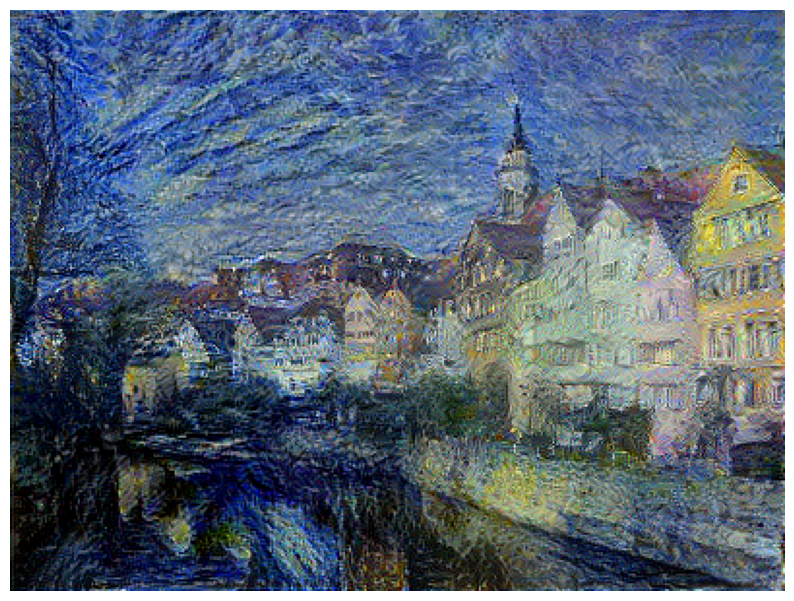

 20%|█▉        | 999/5000 [19:25<1:34:29,  1.42s/it]

Étape 1000, Loss Totale: 2367.51171875


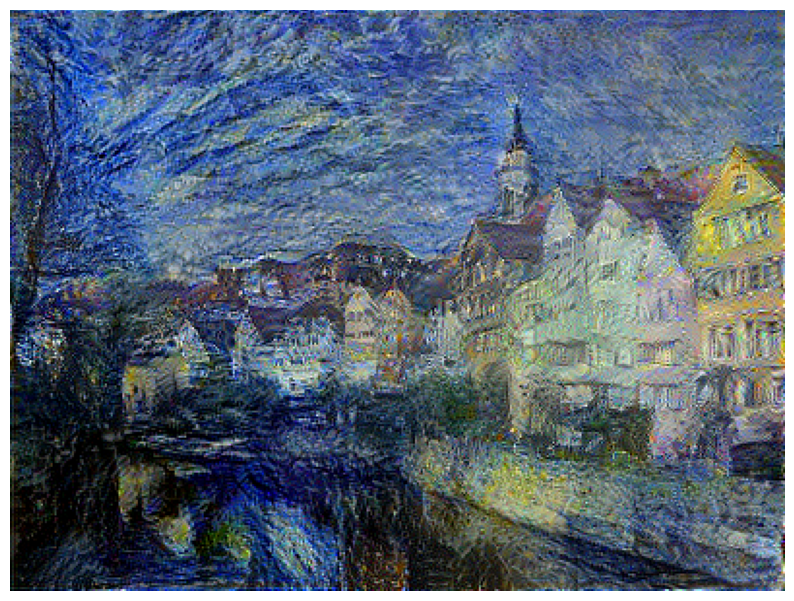

 30%|██▉       | 1499/5000 [31:05<1:20:02,  1.37s/it]

Étape 1500, Loss Totale: 1957.566162109375


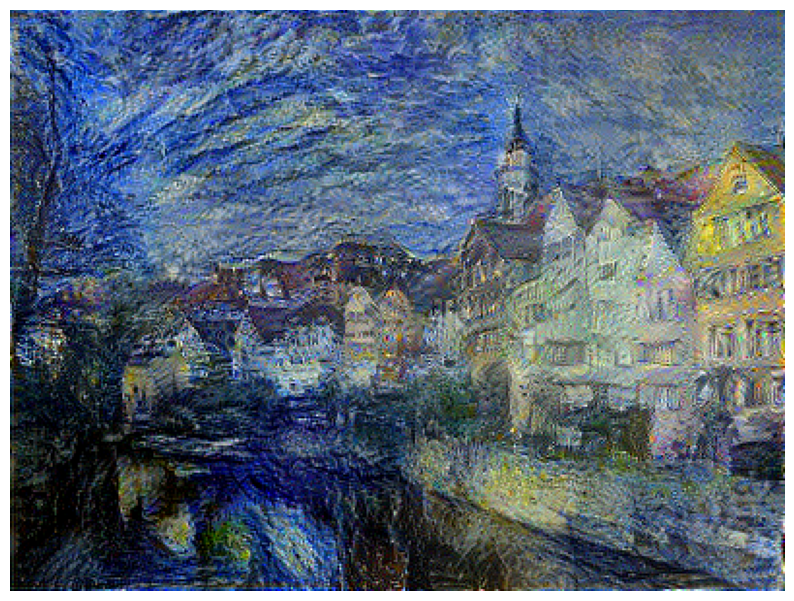

 40%|███▉      | 1999/5000 [42:31<1:08:30,  1.37s/it]

Étape 2000, Loss Totale: 2082.348388671875


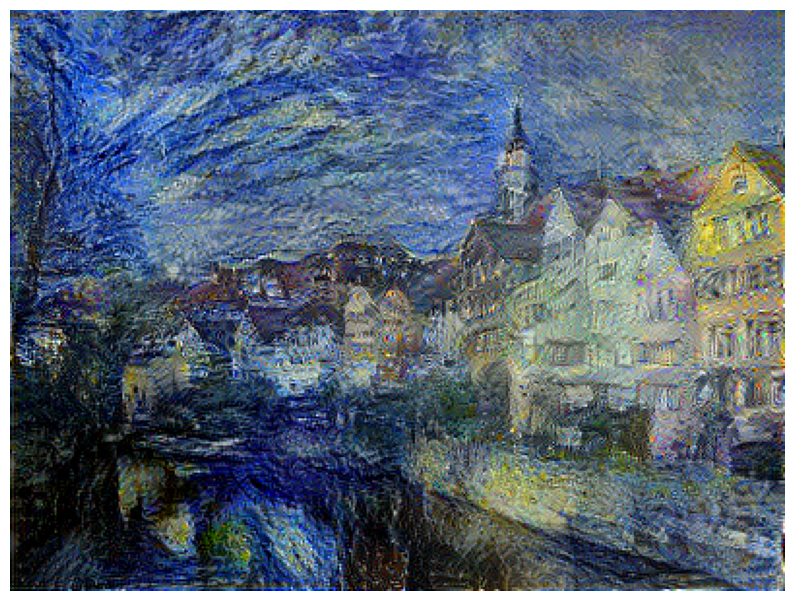

 50%|████▉     | 2499/5000 [53:55<53:01,  1.27s/it]  

Étape 2500, Loss Totale: 2052.9921875


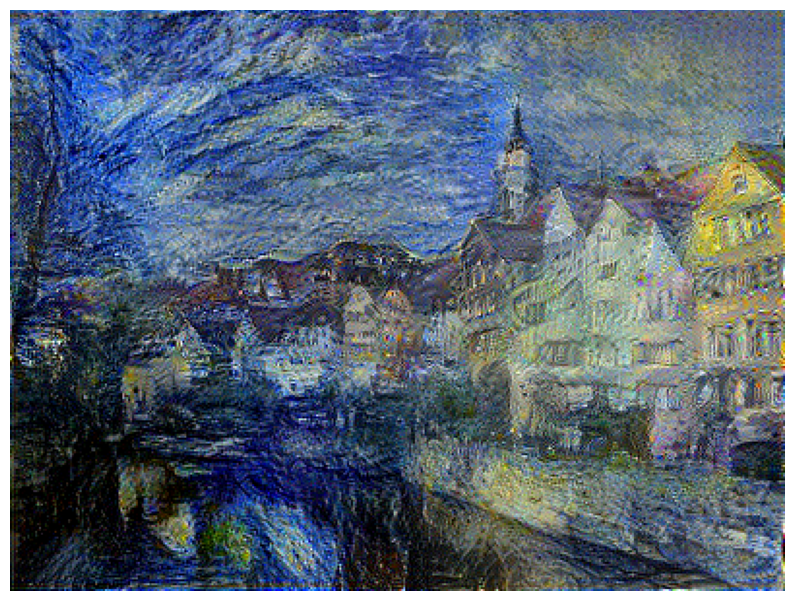

 60%|█████▉    | 2999/5000 [1:03:40<27:24,  1.22it/s]

Étape 3000, Loss Totale: 2036.9757080078125


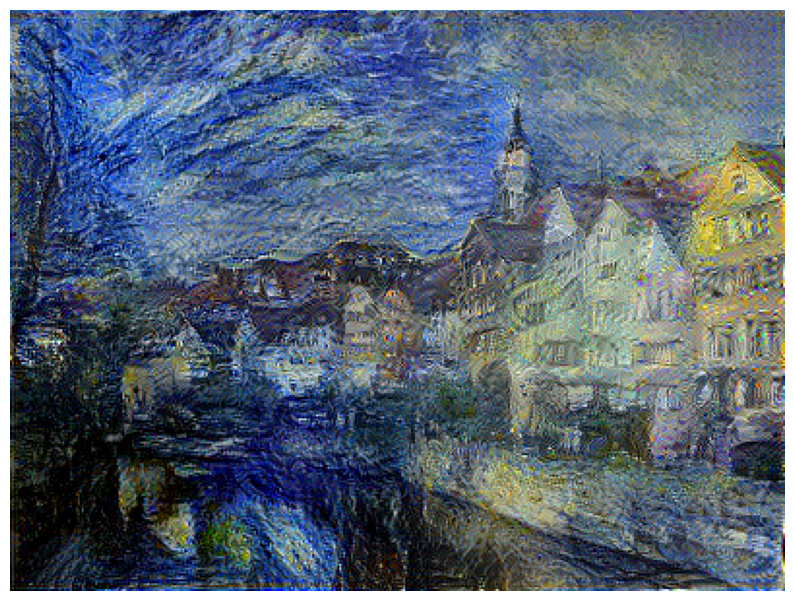

 70%|██████▉   | 3499/5000 [1:10:14<22:22,  1.12it/s]

Étape 3500, Loss Totale: 7753.9697265625


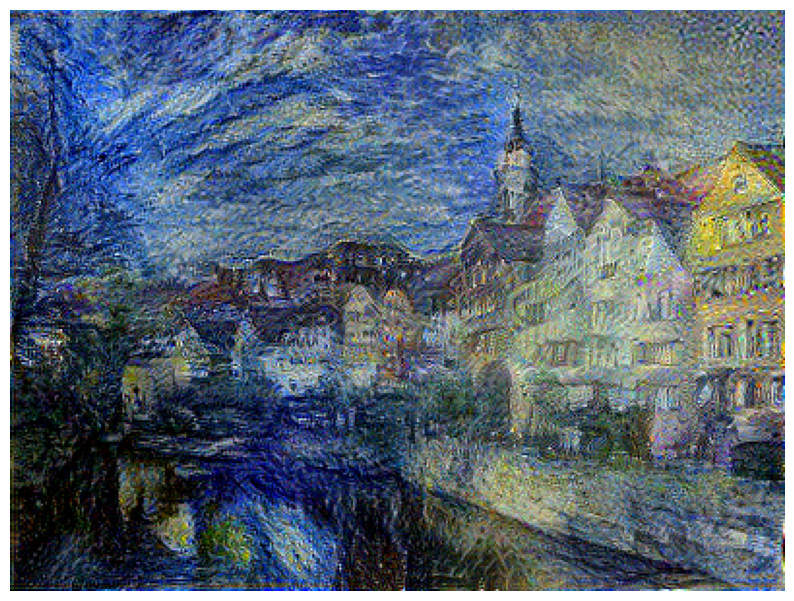

 80%|███████▉  | 3999/5000 [1:18:12<12:28,  1.34it/s]

Étape 4000, Loss Totale: 1882.140380859375


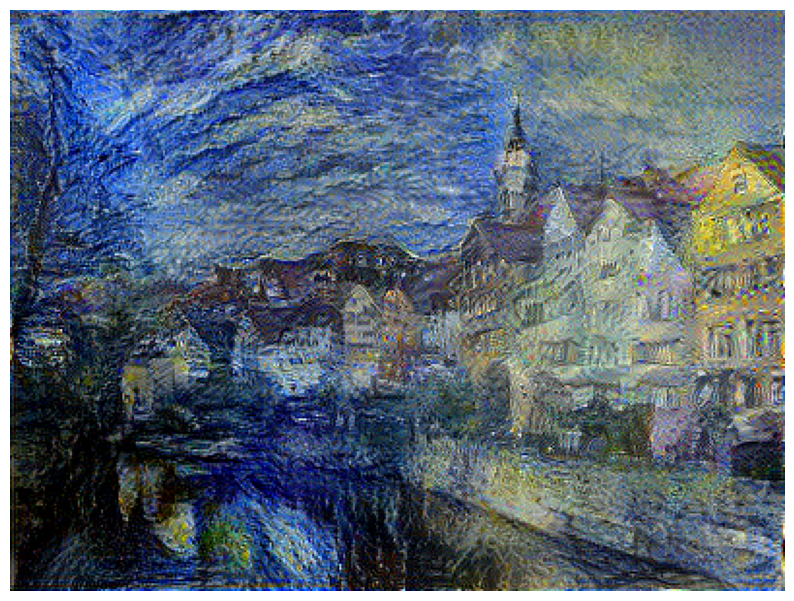

 90%|████████▉ | 4499/5000 [1:24:26<05:53,  1.42it/s]

Étape 4500, Loss Totale: 1954.978759765625


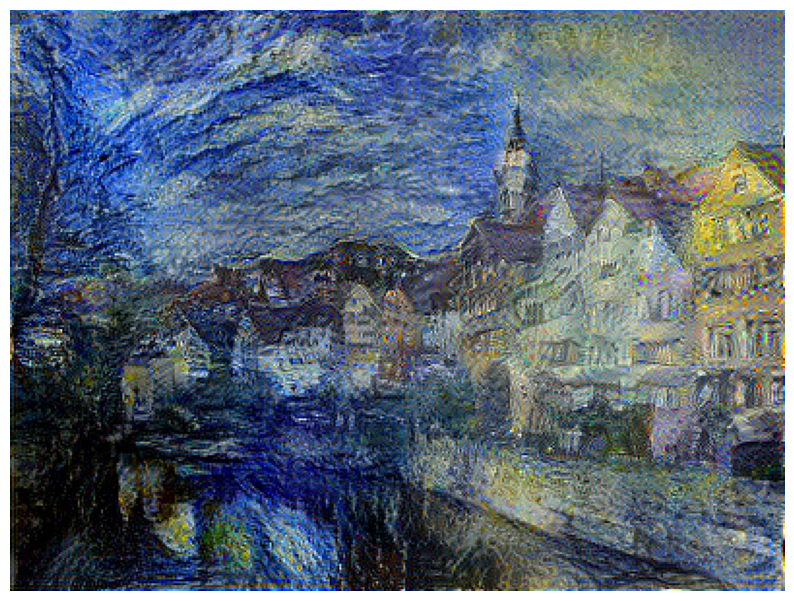

100%|█████████▉| 4999/5000 [1:30:58<00:00,  1.38it/s]

Étape 5000, Loss Totale: 1901.833984375


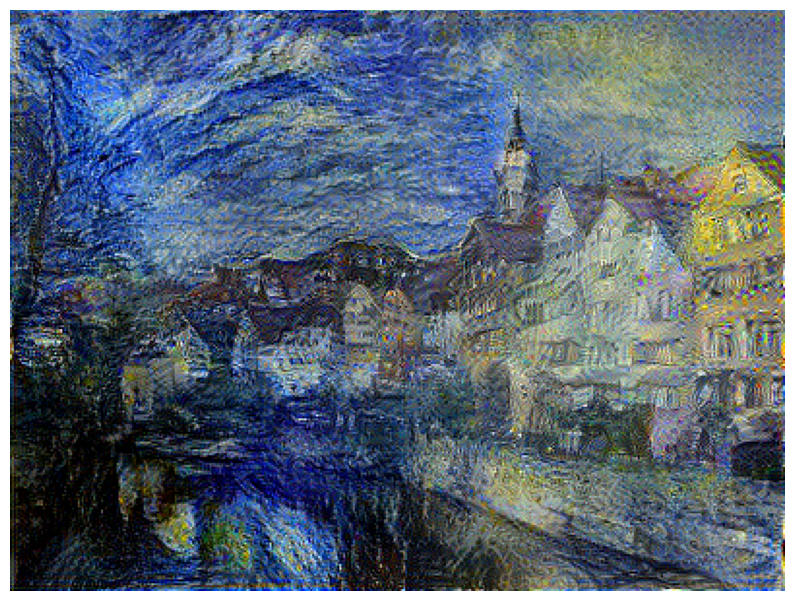

100%|██████████| 5000/5000 [1:31:00<00:00,  1.09s/it]


In [15]:
for iter in tqdm(range(NUM_ITER)):
    # Calculer les gradients à l'aide de tf.GradientTape
    # Compute the gradients using tf.GradientTape
    with tf.GradientTape() as tape:
        # Extraire les caractéristiques du modèle pour l'image générée
        # Extract features from the model for the generated image
        target_features = model(target_img)

        # Calculer la perte de contenu et la perte de style
        # Compute the content loss and style loss
        loss_content = compute_content_loss(content_features, target_features)
        loss_style = compute_style_loss(style_features, target_features, target_img.shape[1] * target_img.shape[2])

        # Calculer la perte totale
        # Compute the total loss
        loss = compute_loss(loss_content,loss_style)
    
    # Calculer les gradients de la perte totale par rapport à l'image générée
    # Compute the gradients of the total loss with respect to the generated image
    grads = tape.gradient(loss, target_img)

    # Appliquer les gradients à l'image générée pour la mettre à jour
    # Apply the gradients to the generated image to update it
    optimizer.apply_gradients([(grads, target_img)])

    # Afficher l'image générée à chaque itération définie
    # Display the generated image every specified number of iterations
    if (iter + 1) % SHOW_IMG_EVERY == 0:
        print(f"Étape {iter+1}, Loss Totale: {loss}")
        target_img_disp = deprocess_image(target_img, target_h, target_w)
        plt.figure(figsize=(10, 10))
        plt.imshow(target_img_disp)
        plt.axis("off")
        plt.show()
        
# Libérer la mémoire de TensorFlow
# Clear TensorFlow session to release memory
tf.keras.backend.clear_session()